In [ ]:
!pip install pyforest
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import datetime as dt
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
import missingno as msno 
import plotly.express as px
import plotly.graph_objects as go
import datetime
from IPython.display import display
from PIL import Image
from sklearn.compose import make_column_transformer

from sklearn.preprocessing import scale 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PowerTransformer 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (16, 9)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

!pip install termcolor
!pip install colorama
import colorama
from colorama import Fore, Style  
from termcolor import colored

import ipywidgets
from ipywidgets import interact

!pip install -U pandas-profiling --user
import pandas_profiling
from pandas_profiling.report.presentation.flavours.html.templates import create_html_assets

!pip install wordcloud
from wordcloud import WordCloud

!pip install squarify
import squarify as sq

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for pyforest: filename=pyforest-1.1.0-py2.py3-none-any.whl size=14606 sha256=21a439a107ea628aa330bfc129f3aba36604db75395fa36f88d80f4fe99bcae2
  Stored in directory: /root/.cache/pip/wheels/d5/1a/3e/6193fe1c56168f5df4aef57d8411033ba4611881135d495727
Successfully built pyforest


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 KB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 KB 28.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 58.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 27.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 KB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 11.9 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-scr

In [ ]:

def analysis(df):
    print("Shape:", df.shape,'\n')
    print("Info:", df.info,'\n')
    print("Number of Uniques:", df.nunique(),'\n')
    print("Missing Values:", df.isnull().sum(),'\n')
    print("All Columns:", list(df.columns),'\n')

    df.columns= df.columns.str.lower().str.replace('&', '_').str.replace(' ', '_')
    print(colored("Columns after rename:", attrs=['bold']), list(df.columns),'\n',
          colored('*'*100, 'red', attrs=['bold']), sep='')


def first_look(col):
    print("Name of the Column : ", col,'\n')
    print("No of uniques : ", df[col].nunique(),'\n')
    print("No of nulls   : ", df[col].isnull().sum(),'\n')
    print("Value counts  : ", df[col].value_counts(dropna = False),'\n')    
    
def multicolinearity_control(df):
    feature =[]
    collinear=[]
    for col in df.corr().columns:
        for i in df.corr().index:
            if (abs(df.corr()[col][i])> .9 and abs(df.corr()[col][i]) < 1):
                    feature.append(col)
                    collinear.append(i)
                    print(colored(f"Multicolinearity alert in between:{col} - {i}", 
                                  "red", attrs=['bold']), df.shape,'\n',
                                  colored('*'*100, 'red', attrs=['bold']), sep='')

def duplicate_values(df):
    duplicate_values = df.duplicated(subset=None, keep='first').sum()
    if duplicate_values > 0:
        df.drop_duplicates(keep='first', inplace=True)
def drop_columns(df, drop_columns):
    if drop_columns !=[]:
        df.drop(drop_columns, axis=1, inplace=True)
def drop_null(df, limit):
    for i in df.isnull().sum().index:
        if (df.isnull().sum()[i]/df.shape[0]*100)>limit:
            print(df.isnull().sum()[i], 'percent of', i ,'null and were dropped')
            df.drop(i, axis=1, inplace=True)

def fill_most(df, group_col, col_name):
    for group in list(df[group_col].unique()):
        cond = df[group_col]==group
        mode = list(df[cond][col_name].mode())
        if mode != []:
            df.loc[cond, col_name] = df.loc[cond, col_name].fillna(df[cond][col_name].mode()[0])
        else:
            df.loc[cond, col_name] = df.loc[cond, col_name].fillna(df[col_name].mode()[0])

In [ ]:
def explore(x):
    divider = "*_*"
    print("\n {} \n".format((divider*20))) 
    print("Dataframe Makeup \n") 
    x.info() 
    print("\n {} \n".format((divider*20))) 
    print("Descriptive Statistics \n\n", x.describe().round(2)) 
    print("\n {} \n".format((divider*20)))
    print("Shape of dataframe: {}".format(x.shape)) 
    print("\n {} \n".format((divider*20))) 
    return

In [ ]:
link = "https://archive.ics.uci.edu/ml/machine-learning-databases/00352/Online%20Retail.xlsx"
df0 = pd.read_excel(link)


In [ ]:
df = df0.copy()
df.head() 

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom


In [ ]:
analysis(df)
duplicate_values(df)
drop_columns(df, [])
drop_null(df, 90)

Shape: (541909, 8) 

Info: <bound method DataFrame.info of        InvoiceNo StockCode                          Description  Quantity  \
0         536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365     71053                  WHITE METAL LANTERN         6   
2         536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3         536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...       ...                                  ...       ...   
541904    581587     22613          PACK OF 20 SPACEBOY NAPKINS        12   
541905    581587     22899         CHILDREN'S APRON DOLLY GIRL          6   
541906    581587     23254        CHILDRENS CUTLERY DOLLY GIRL          4   
541907    581587     23255      CHILDRENS CUTLERY CIRCUS PARADE         4   
541908    581587     22138        BAKING SET 9 PIECE RETROSPOT          3   

               I

In [ ]:
df.columns

Index(['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate',
       'unitprice', 'customerid', 'country'],
      dtype='object')

In [ ]:
df['total_price'] = df['quantity'] * df['unitprice']

In [ ]:
df.head(5)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34


### invoiceno

In [ ]:
print("Total number of invoices by country :")
df.groupby('country')['invoiceno'].count()

Total number of invoices by country :


country
Australia                 1258
Austria                    401
Bahrain                     19
Belgium                   2069
Brazil                      32
Canada                     151
Channel Islands            757
Cyprus                     611
Czech Republic              30
Denmark                    389
EIRE                      8184
European Community          61
Finland                    695
France                    8541
Germany                   9480
Greece                     146
Hong Kong                  284
Iceland                    182
Israel                     294
Italy                      803
Japan                      358
Lebanon                     45
Lithuania                   35
Malta                      127
Netherlands               2371
Norway                    1086
Poland                     341
Portugal                  1510
RSA                         58
Saudi Arabia                10
Singapore                  229
Spain                     2528


In [ ]:
fig = px.histogram(df, 
                   x = 'country', 
                   title = 'The Number of Invoices by Country', 
                   color='country').update_xaxes(categoryorder="total descending")
fig.show(renderer="colab")

In [ ]:
fig = px.histogram(df, 
                   x = df.groupby('country')['invoiceno'].nunique().index,
                   y = df.groupby('country')['invoiceno'].nunique().values, 
                   title = 'The Unique Number of Invoices by Country', 
                   labels = dict(x = "Countries", y ="Invoice")).update_xaxes(categoryorder="total descending")
fig.show(renderer="colab");

In [ ]:
CA_values = (df['invoiceno'].str.startswith('C') | df['invoiceno'].str.startswith('A')).value_counts()
CA_values = pd.DataFrame(CA_values)
CA_values.rename(index={False: 'Invoices Without C & A', True: 'Invoices With C & A'}, inplace=True)
CA_values

,invoiceno
Invoices Without C & A,527387
Invoices With C & A,9254


In [ ]:
fig = px.pie(CA_values, 
             values = CA_values['invoiceno'], 
             names = CA_values.index, 
             title = "The Percentage of 'invoiceno' Starts With A or C")

fig.show(renderer="colab")

### stockcode & description

In [ ]:
print("Number of Missing Values")
df[['stockcode', 'description']].isnull().sum()

Number of Missing Values


stockcode         0
description    1454
dtype: int64

In [ ]:
print("Cross check")
df[(df['stockcode'].notnull()) & (df['description'].isnull())][['stockcode','description']]

Cross check


,stockcode,description
622,22139,NaN
1970,21134,NaN
1971,22145,NaN
1972,37509,NaN
1987,85226A,NaN
...,...,...
535322,84581,NaN
535326,23406,NaN
535332,21620,NaN
536981,72817,NaN


In [ ]:
print("Cross check")
df[(df['description'].notnull()) & (df['stockcode'].isnull())][['stockcode','description']]

Cross check


,stockcode,description


In [ ]:
print("Cross check")
df[df['stockcode']=='22139.0']['description'].value_counts(dropna=False)

Cross check


Series([], Name: description, dtype: int64)

In [ ]:
df[df['stockcode']=='22139.0'][['invoiceno','description']].value_counts()[:5]

Series([], dtype: int64)

### quantity

In [ ]:
print("The Number of Observations in the 'Quantity' Column Which are Below 0")
(df['quantity']<0).value_counts()

The Number of Observations in the 'Quantity' Column Which are Below 0


False    526054
True      10587
Name: quantity, dtype: int64

In [ ]:
print("The Number of Observations in the 'Quantity' Column Which are Above 0")
df[df['quantity'] > 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

The Number of Observations in the 'Quantity' Column Which are Above 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.00,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.00,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.00,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.00,France


In [ ]:
print("The Number of Observations in the 'Quantity' Column Which Equal to 0")
df[df['quantity'] == 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

The Number of Observations in the 'Quantity' Column Which Equal to 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country


In [ ]:
print("The Number of Observations in the 'Quantity' Column Which are Below 0")
df[df['quantity'] < 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

The Number of Observations in the 'Quantity' Column Which are Below 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.00,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.00,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.00,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.00,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.00,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.00,United Kingdom
541541,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.00,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.00,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.00,United Kingdom


In [ ]:
(df['quantity'] < 0).value_counts()

False    526054
True      10587
Name: quantity, dtype: int64

In [ ]:
quantity_values = (df['quantity'] < 0).value_counts()
quantity_values = pd.DataFrame(quantity_values)
quantity_values.rename(index={False: 'Invoices Smaller Than 0', True: 'Invoices Bigger Than 0'}, inplace=True)
quantity_values

,quantity
Invoices Smaller Than 0,526054
Invoices Bigger Than 0,10587


In [ ]:
fig = px.pie(quantity_values, 
             values = quantity_values['quantity'], 
             names = quantity_values.index, 
             title = 'Quantity Smaller/Bigger')

fig.show(renderer="colab")

### unitprice

In [ ]:
print("The Number of Items in the 'unitprice' Column Which are Above 0")
df[df['unitprice'] > 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']].head()

The Number of Items in the 'unitprice' Column Which are Above 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom


In [ ]:
print("The Number of Observations in the 'unitprice' Column Which Equal to 0")
df[df['unitprice']==0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']].head()

The Number of Observations in the 'unitprice' Column Which Equal to 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom
1970,536545,21134,NaN,1,2010-12-01 14:32:00,0.00,NaN,United Kingdom
1971,536546,22145,NaN,1,2010-12-01 14:33:00,0.00,NaN,United Kingdom
1972,536547,37509,NaN,1,2010-12-01 14:33:00,0.00,NaN,United Kingdom
1987,536549,85226A,NaN,1,2010-12-01 14:34:00,0.00,NaN,United Kingdom


In [ ]:
print("The Number of Observations in the 'unitprice' Column Which are Below 0")
df[df['unitprice']<0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']].head()

The Number of Observations in the 'unitprice' Column Which are Below 0


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom


### customerid

In [ ]:
print("Customer Number by Orders (Top 5)")
df.groupby(['customerid', 'country'])['invoiceno'].count().sort_values(ascending=False).head()

Customer Number by Orders (Top 5)


customerid  country       
17841.00    United Kingdom    7812
14911.00    EIRE              5898
14096.00    United Kingdom    5128
12748.00    United Kingdom    4459
14606.00    United Kingdom    2759
Name: invoiceno, dtype: int64

In [ ]:
print("Customer Number by Orders (Bottom 5)")
df.groupby(['customerid', 'country'])['invoiceno'].count().sort_values().head()

Customer Number by Orders (Bottom 5)


customerid  country       
17291.00    United Kingdom    1
14576.00    United Kingdom    1
15562.00    United Kingdom    1
13017.00    United Kingdom    1
16579.00    United Kingdom    1
Name: invoiceno, dtype: int64

In [ ]:
print("Customer Status According to the Number of Items in the Orders (Top 5)")
df.groupby(['customerid', 'country'])['quantity'].sum().sort_values(ascending=False).head()

Customer Status According to the Number of Items in the Orders (Top 5)


customerid  country       
14646.00    Netherlands       196719
12415.00    Australia          77242
14911.00    EIRE               77155
17450.00    United Kingdom     69009
18102.00    United Kingdom     64122
Name: quantity, dtype: int64

In [ ]:
print("Customer Status According to the Spendings (Top 5)")
df.groupby(['customerid', 'country'])['total_price'].sum().sort_values(ascending=False).head()

Customer Status According to the Spendings (Top 5)


customerid  country       
14646.00    Netherlands      279489.02
18102.00    United Kingdom   256438.49
17450.00    United Kingdom   187322.17
14911.00    EIRE             132458.73
12415.00    Australia        123725.45
Name: total_price, dtype: float64

In [ ]:
fig = px.histogram(df, x = df.groupby('country')['customerid'].nunique().index, 
                   y = df.groupby('country')['customerid'].nunique().values, 
                   title = 'The Number of Customers By Country',
                   labels = dict(x = "Countries", y ="Customer")).update_xaxes(categoryorder="total descending")
fig.show(renderer="colab")

In [ ]:
df_wo_UK = df.groupby('country')["customerid"].nunique().sort_values(ascending=False).iloc[1:]

fig = px.histogram(df, x = df_wo_UK.index, 
                   y = df_wo_UK.values, 
                   title = 'The Number of Customers By Country Without UK',
                   labels = dict(x = "Countries", y ="Customer")).update_xaxes(categoryorder="total descending")
fig.show(renderer="colab")

### invoicedate

In [ ]:
df.invoicedate.max()

Timestamp('2011-12-09 12:50:00')

In [ ]:
df.invoicedate.min()

Timestamp('2010-12-01 08:26:00')

In [ ]:
df[df['quantity'] < 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.00,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.00,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.00,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.00,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.00,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.00,United Kingdom
541541,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.00,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.00,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.00,United Kingdom


In [ ]:
df[df['quantity'] > 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']].head(1)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom


In [ ]:
df[df['quantity'] == 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country


In [ ]:
df[df['unitprice'] < 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom


In [ ]:
df[df['unitprice'] > 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.00,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.00,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.00,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.00,France


In [ ]:
df[df['unitprice'] == 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom
1970,536545,21134,NaN,1,2010-12-01 14:32:00,0.00,NaN,United Kingdom
1971,536546,22145,NaN,1,2010-12-01 14:33:00,0.00,NaN,United Kingdom
1972,536547,37509,NaN,1,2010-12-01 14:33:00,0.00,NaN,United Kingdom
1987,536549,85226A,NaN,1,2010-12-01 14:34:00,0.00,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
536981,581234,72817,NaN,27,2011-12-08 10:33:00,0.00,NaN,United Kingdom
538504,581406,46000M,POLYESTER FILLER PAD 45x45cm,240,2011-12-08 13:58:00,0.00,NaN,United Kingdom
538505,581406,46000S,POLYESTER FILLER PAD 40x40cm,300,2011-12-08 13:58:00,0.00,NaN,United Kingdom
538554,581408,85175,NaN,20,2011-12-08 14:06:00,0.00,NaN,United Kingdom


In [ ]:

df["invoiceno"].str.startswith('C').value_counts()

True     9251
False       3
Name: invoiceno, dtype: int64

In [ ]:
print("Cancelled Orders")
df[df['quantity'] < 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

Cancelled Orders


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.00,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.00,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.00,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.00,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.00,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.00,United Kingdom
541541,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.00,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.00,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.00,United Kingdom


In [ ]:
cancelled_orders = (df['invoiceno'].str.startswith('C').value_counts())
cancelled_orders = pd.DataFrame(cancelled_orders)
cancelled_orders.rename(index={False: 'Non-Cancelled Orders', True: 'Cancelled Orders'}, inplace=True)
cancelled_orders

,invoiceno
Cancelled Orders,9251
Non-Cancelled Orders,3


In [ ]:
fig = px.pie(cancelled_orders, 
             values = cancelled_orders['invoiceno'], 
             names = cancelled_orders.index, 
             title = 'The Proportion of Canceled Orders')

fig.show(renderer="colab")

In [ ]:
print("Non-Cancelled Orders")
df[df['quantity'] > 0][['invoiceno', 'stockcode', 'description', 'quantity', 'invoicedate', 'unitprice', 'customerid', 'country']]

Non-Cancelled Orders


,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.00,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.00,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.00,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.00,France


In [ ]:
df[df['unitprice'] < 0]

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom,-11062.06
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom,-11062.06


In [ ]:
df[df['unitprice'] == 0]

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.00,NaN,United Kingdom,0.00
1970,536545,21134,NaN,1,2010-12-01 14:32:00,0.00,NaN,United Kingdom,0.00
1971,536546,22145,NaN,1,2010-12-01 14:33:00,0.00,NaN,United Kingdom,0.00
1972,536547,37509,NaN,1,2010-12-01 14:33:00,0.00,NaN,United Kingdom,0.00
1987,536549,85226A,NaN,1,2010-12-01 14:34:00,0.00,NaN,United Kingdom,0.00
...,...,...,...,...,...,...,...,...,...
536981,581234,72817,NaN,27,2011-12-08 10:33:00,0.00,NaN,United Kingdom,0.00
538504,581406,46000M,POLYESTER FILLER PAD 45x45cm,240,2011-12-08 13:58:00,0.00,NaN,United Kingdom,0.00
538505,581406,46000S,POLYESTER FILLER PAD 40x40cm,300,2011-12-08 13:58:00,0.00,NaN,United Kingdom,0.00
538554,581408,85175,NaN,20,2011-12-08 14:06:00,0.00,NaN,United Kingdom,0.00


<Figure size 1000x500 with 0 Axes>

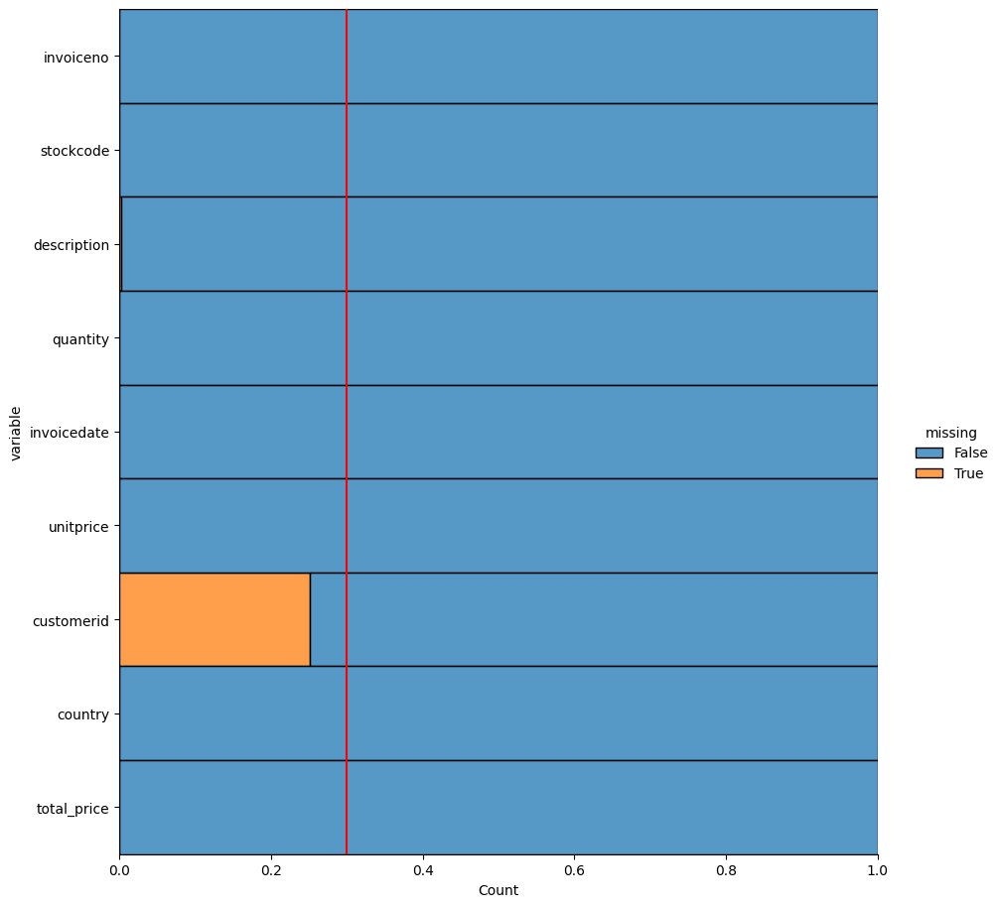

In [ ]:
plt.figure(figsize = (10, 5))

sns.displot(
    data = df.isnull().melt(value_name = "missing"),
    y = "variable",
    hue = "missing",
    multiple = "fill",
    height = 9.25)

plt.axvline(0.3, color = "r");

In [ ]:
df = df.dropna(subset=["customerid"])
df.shape

(401604, 9)

<Figure size 1000x500 with 0 Axes>

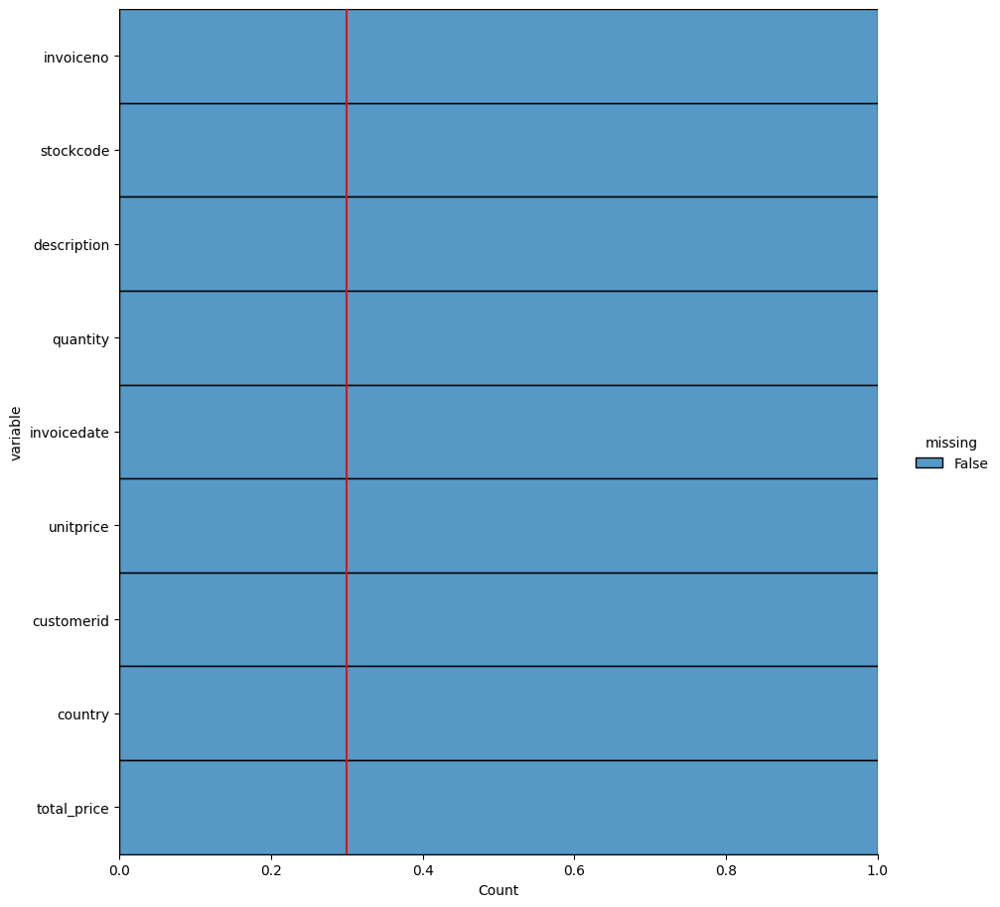

In [ ]:
plt.figure(figsize = (10, 5))

sns.displot(
    data = df.isnull().melt(value_name = "missing"),
    y = "variable",
    hue = "missing",
    multiple = "fill",
    height = 9.25)

plt.axvline(0.3, color = "r");

In [ ]:
df = df[(df['unitprice'] > 0) & (df['quantity'] > 0)]

In [ ]:
print("There are", df.duplicated(subset=None, keep='first').sum(), "duplicated observations in the dataset.")
print(df.duplicated(subset=None, keep='first').sum(), "Duplicated observations are dropped!")
df.drop_duplicates(keep='first', inplace=True)

There are 0 duplicated observations in the dataset.
0 Duplicated observations are dropped!


In [ ]:
df['total_price'] = df['quantity'] * df['unitprice']
df.head(3)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,22.00


In [ ]:
total_revenue = df.groupby("country")["total_price"].sum().sort_values(ascending=False)
total_revenue

country
United Kingdom         7285024.64
Netherlands             285446.34
EIRE                    265262.46
Germany                 228678.40
France                  208934.31
Australia               138453.81
Spain                    61558.56
Switzerland              56443.95
Belgium                  41196.34
Sweden                   38367.83
Japan                    37416.37
Norway                   36165.44
Portugal                 33375.84
Finland                  22546.08
Singapore                21279.29
Channel Islands          20440.54
Denmark                  18955.34
Italy                    17483.24
Cyprus                   13502.85
Austria                  10198.68
Poland                    7334.65
Israel                    7215.84
Greece                    4760.52
Iceland                   4310.00
Canada                    3666.38
USA                       3580.39
Malta                     2725.59
Unspecified               2660.77
United Arab Emirates      1902.28
Lebano

In [ ]:
customer_num = df.groupby("country")['customerid'].nunique().sort_values(ascending=False)
customer_num

country
United Kingdom          3920
Germany                   94
France                    87
Spain                     30
Belgium                   25
Switzerland               21
Portugal                  19
Italy                     14
Finland                   12
Austria                   11
Norway                    10
Netherlands                9
Australia                  9
Denmark                    9
Channel Islands            9
Cyprus                     8
Sweden                     8
Japan                      8
Poland                     6
USA                        4
Canada                     4
Unspecified                4
Greece                     4
EIRE                       3
Israel                     3
Malta                      2
United Arab Emirates       2
Bahrain                    2
Czech Republic             1
Lithuania                  1
Lebanon                    1
RSA                        1
Saudi Arabia               1
Singapore                  1
Icelan

In [ ]:
customer_num.sum()

4346

In [ ]:
dfg1 = df.groupby('country')["customerid"].nunique().sort_values(ascending=False)
fig = px.bar(x=dfg1.index, 
             y=dfg1, 
             title="Customers By Countries", 
             labels=dict(x="Countries", y="Total Number of Customers"))

fig.show(renderer="colab")

In [ ]:
dfg1_w_oUK = df.groupby('country')["customerid"].nunique().sort_values(ascending=False).iloc[1:]
fig = px.bar(x=dfg1_w_oUK.index, 
             y=dfg1_w_oUK, 
             title="Customers By Countries Without The UK", 
             labels=dict(x="Countries", y="Total Number of Customers Without The UK"))

fig.show(renderer="colab")

In [ ]:
dfg1 = pd.DataFrame(dfg1).reset_index()
dfg1

,country,customerid
0,United Kingdom,3920
1,Germany,94
2,France,87
3,Spain,30
4,Belgium,25
5,Switzerland,21
6,Portugal,19
7,Italy,14
8,Finland,12
9,Austria,11


In [ ]:
dfg1["country"] = dfg1["country"].str.split(" ").str.join("_")
dfg1

,country,customerid
0,United_Kingdom,3920
1,Germany,94
2,France,87
3,Spain,30
4,Belgium,25
5,Switzerland,21
6,Portugal,19
7,Italy,14
8,Finland,12
9,Austria,11


In [ ]:
dfg1_list = dict(zip(dfg1['country'].tolist(), dfg1['customerid'].tolist()))
dfg1_list

{'United_Kingdom': 3920,
 'Germany': 94,
 'France': 87,
 'Spain': 30,
 'Belgium': 25,
 'Switzerland': 21,
 'Portugal': 19,
 'Italy': 14,
 'Finland': 12,
 'Austria': 11,
 'Norway': 10,
 'Netherlands': 9,
 'Australia': 9,
 'Denmark': 9,
 'Channel_Islands': 9,
 'Cyprus': 8,
 'Sweden': 8,
 'Japan': 8,
 'Poland': 6,
 'USA': 4,
 'Canada': 4,
 'Unspecified': 4,
 'Greece': 4,
 'EIRE': 3,
 'Israel': 3,
 'Malta': 2,
 'United_Arab_Emirates': 2,
 'Bahrain': 2,
 'Czech_Republic': 1,
 'Lithuania': 1,
 'Lebanon': 1,
 'RSA': 1,
 'Saudi_Arabia': 1,
 'Singapore': 1,
 'Iceland': 1,
 'Brazil': 1,
 'European_Community': 1}

In [ ]:
import plotly.graph_objects as go

dfg2 = df.groupby('country')["total_price"].sum().sort_values(ascending=False)
fig = px.bar(x=dfg2.index, 
             y=dfg2, 
             title="Total Cost (£) By Countries", 
             labels=dict(x="Countries", y="Total Cost (£)"))

fig.show(renderer="colab")

In [ ]:
dfg2_w_oUK = df.groupby('country')["customerid"].nunique().sort_values(ascending=False).iloc[1:]
fig = px.bar(x=dfg2_w_oUK.index, 
             y=dfg2_w_oUK, 
             title="Customers By Countries Without The UK", 
             labels=dict(x="Countries", y="Total Number of Customers Without The UK"))

fig.show(renderer="colab")

In [ ]:
dfg2 = pd.DataFrame(dfg2).reset_index()
dfg2["country"] = dfg2["country"].str.split(" ").str.join("_")
dfg2

,country,total_price
0,United_Kingdom,7285024.64
1,Netherlands,285446.34
2,EIRE,265262.46
3,Germany,228678.40
4,France,208934.31
5,Australia,138453.81
6,Spain,61558.56
7,Switzerland,56443.95
8,Belgium,41196.34
9,Sweden,38367.83


In [ ]:
dfg2_list = dict(zip(dfg1['country'].tolist(), dfg2['total_price'].tolist()))
dfg2_list

{'United_Kingdom': 7285024.644,
 'Germany': 285446.34,
 'France': 265262.46,
 'Spain': 228678.4,
 'Belgium': 208934.31,
 'Switzerland': 138453.81,
 'Portugal': 61558.56,
 'Italy': 56443.95,
 'Finland': 41196.34,
 'Austria': 38367.83,
 'Norway': 37416.369999999995,
 'Netherlands': 36165.44,
 'Australia': 33375.840000000004,
 'Denmark': 22546.08,
 'Channel_Islands': 21279.29,
 'Cyprus': 20440.54,
 'Sweden': 18955.34,
 'Japan': 17483.24,
 'Poland': 13502.85,
 'USA': 10198.68,
 'Canada': 7334.65,
 'Unspecified': 7215.84,
 'Greece': 4760.52,
 'EIRE': 4310.0,
 'Israel': 3666.38,
 'Malta': 3580.39,
 'United_Arab_Emirates': 2725.59,
 'Bahrain': 2660.77,
 'Czech_Republic': 1902.28,
 'Lithuania': 1693.88,
 'Lebanon': 1661.06,
 'RSA': 1300.25,
 'Saudi_Arabia': 1143.6,
 'Singapore': 1002.3100000000001,
 'Iceland': 826.74,
 'Brazil': 548.4,
 'European_Community': 145.92}

In [ ]:
df_uk = df[df["country"]=="United Kingdom"]
df_uk.head(3)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,22.00


## <a id="5"></a>
## <p style="background-color:#9452a5; font-family:newtimeroman; color:#FFF9ED; font-size:150%; text-align:center; border-radius:10px 10px;"> RFM ANALYSIS<p>

In [ ]:
import datetime as dt
from datetime import datetime
from datetime import timedelta

In [ ]:
df_uk.head()

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34


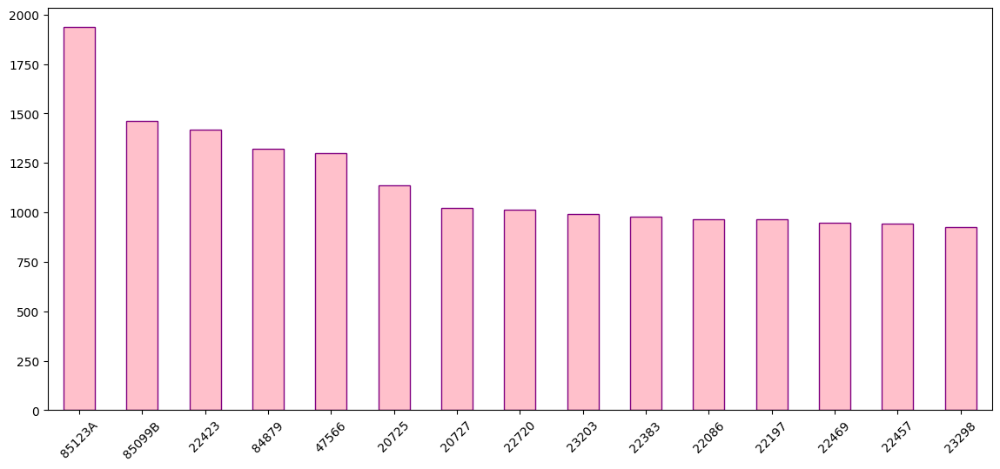

In [ ]:

df_uk["stockcode"].value_counts().head(15).plot(kind="bar", width=0.5, color='pink', edgecolor='purple', figsize=(14, 6))
plt.xticks(rotation=45);

In [ ]:
min_invoice_date = min(df_uk['invoicedate'])
min_invoice_date

Timestamp('2010-12-01 08:26:00')

In [ ]:
max_invoice_date = max(df_uk['invoicedate'])
max_invoice_date

Timestamp('2011-12-09 12:49:00')

In [ ]:
df_uk['last_purchase_date'] = df_uk.groupby('customerid')['invoicedate'].transform(max)

In [ ]:
df_uk['last_purchase_date'] = pd.to_datetime(df_uk['last_purchase_date']).dt.date

In [ ]:
df_uk['last_purchase_date'] = pd.to_datetime(df_uk['last_purchase_date'])
df_uk['invoicedate'] = pd.to_datetime(df_uk['invoicedate'])

In [ ]:

df_uk['ref_date'] = df_uk['invoicedate'].max() + timedelta(days=7)

In [ ]:
df_uk['ref_date'] = df_uk['ref_date'].dt.date

In [ ]:
df_uk['ref_date'] = pd.to_datetime(df_uk['ref_date'])

In [ ]:
df_uk['date'] = pd.to_datetime(df_uk['invoicedate'])

In [ ]:
df_uk['date'] = df_uk['date'].dt.date

In [ ]:
customer_recency = pd.DataFrame(df_uk.groupby('customerid', as_index=False).date.max())
customer_recency.head()

,customerid,date
0,12346.00,2011-01-18
1,12747.00,2011-12-07
2,12748.00,2011-12-09
3,12749.00,2011-12-06
4,12820.00,2011-12-06


In [ ]:
df_uk["customer_recency"] = df_uk["ref_date"] - df_uk["last_purchase_date"]
df_uk[["customerid", 'last_purchase_date', "ref_date", "customer_recency"]]

,customerid,last_purchase_date,ref_date,customer_recency
0,17850.00,2010-12-02,2011-12-16,379 days
1,17850.00,2010-12-02,2011-12-16,379 days
2,17850.00,2010-12-02,2011-12-16,379 days
3,17850.00,2010-12-02,2011-12-16,379 days
4,17850.00,2010-12-02,2011-12-16,379 days
...,...,...,...,...
541889,15804.00,2011-12-09,2011-12-16,7 days
541890,13113.00,2011-12-09,2011-12-16,7 days
541891,13113.00,2011-12-09,2011-12-16,7 days
541892,13113.00,2011-12-09,2011-12-16,7 days


In [ ]:
df_uk['recency2'] = pd.to_numeric(df_uk['customer_recency'].dt.days.astype('int64'))
df_uk[["customerid", 'last_purchase_date', "ref_date", "customer_recency", 'recency2']]


,customerid,last_purchase_date,ref_date,customer_recency,recency2
0,17850.00,2010-12-02,2011-12-16,379 days,379
1,17850.00,2010-12-02,2011-12-16,379 days,379
2,17850.00,2010-12-02,2011-12-16,379 days,379
3,17850.00,2010-12-02,2011-12-16,379 days,379
4,17850.00,2010-12-02,2011-12-16,379 days,379
...,...,...,...,...,...
541889,15804.00,2011-12-09,2011-12-16,7 days,7
541890,13113.00,2011-12-09,2011-12-16,7 days,7
541891,13113.00,2011-12-09,2011-12-16,7 days,7
541892,13113.00,2011-12-09,2011-12-16,7 days,7


In [ ]:
customer_recency = df_uk.groupby('customerid', as_index=False)['recency2'].mean()
customer_recency.rename(columns={'recency2':'Recency'}, inplace=True)
customer_recency.sort_values(by='Recency', ascending=False).head()

,customerid,Recency
3452,17643.00,380.00
1800,15350.00,380.00
2220,15922.00,380.00
2307,16048.00,380.00
1004,14237.00,380.00


**5. Drop Last_Purchase_Date since we don't need it anymore**

In [ ]:
df_uk.drop(['last_purchase_date'], axis = 1, inplace=True)
df_uk.head(3)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency2
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,15.30,2011-12-16,2010-12-01,379 days,379
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34,2011-12-16,2010-12-01,379 days,379
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,22.00,2011-12-16,2010-12-01,379 days,379


**6. Plot RFM distributions**

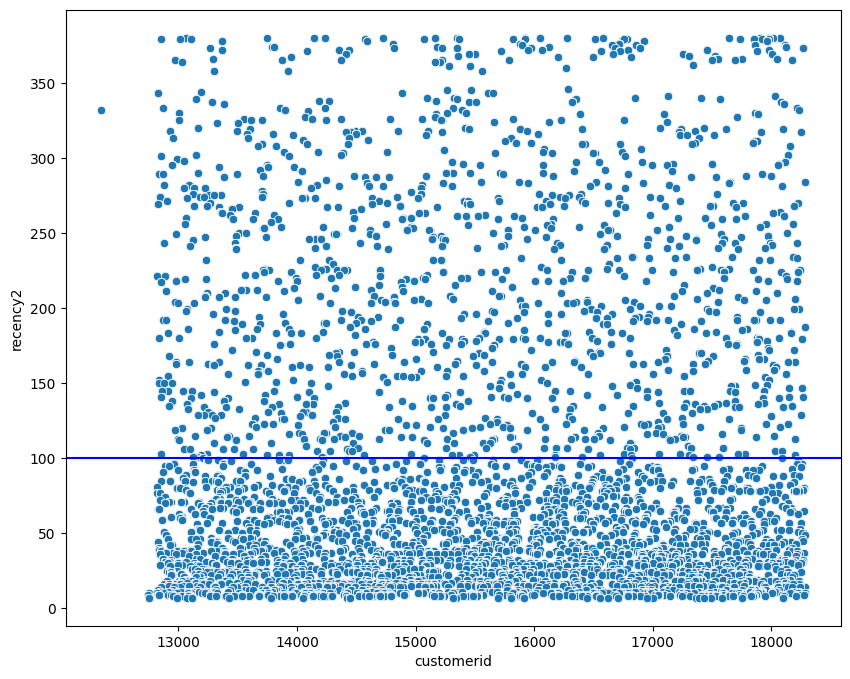

In [ ]:
%matplotlib inline

plt.figure(figsize=(10, 8))
graph = sns.scatterplot(data=df_uk, x="customerid", y="recency2")
graph.axhline(100, color="blue")
plt.show();

In [ ]:
fig = px.scatter(df_uk, x="customerid", y="recency2")
fig.show(renderer="colab")

In [ ]:
fig = px.histogram(df_uk, x="recency2", nbins=70)
fig.show(renderer="colab")

In [ ]:
dfUK_copy = df_uk.copy()
dfUK_copy.head(3)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency2
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,15.30,2011-12-16,2010-12-01,379 days,379
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34,2011-12-16,2010-12-01,379 days,379
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,22.00,2011-12-16,2010-12-01,379 days,379


**2. Calculate the frequency of purchases**

In [ ]:
customer_frequency = dfUK_copy.groupby('customerid', as_index=False)['invoiceno'].nunique()
customer_frequency.rename(columns={'invoiceno':'Frequency'}, inplace=True)
customer_frequency.sort_values(by='Frequency', ascending=False)

,customerid,Frequency
2,12748.00,209
3593,17841.00,124
191,13089.00,97
1267,14606.00,93
1771,15311.00,91
...,...,...
953,14165.00,1
955,14171.00,1
957,14174.00,1
2576,16415.00,1


**3. Plot RFM distributions**

In [ ]:
fig = px.scatter(customer_frequency, x="customerid", y="Frequency")
fig.show(renderer="colab")

In [ ]:
fig = px.histogram(customer_frequency, x="customerid", y="Frequency", nbins=3920)
fig.show(renderer="colab")

In [ ]:
customer_monetary = dfUK_copy.groupby('customerid', as_index=False)['total_price'].sum()
customer_monetary.rename(columns={'total_price':'Monetary'}, inplace=True)
customer_monetary.sort_values(by='Monetary', ascending=False).head()

,customerid,Monetary
3783,18102.00,259657.30
3314,17450.00,194390.79
2598,16446.00,168472.50
3356,17511.00,91062.38
2294,16029.00,80850.84


In [ ]:
customer_monetary.nlargest(5, "Monetary")

,customerid,Monetary
3783,18102.00,259657.30
3314,17450.00,194390.79
2598,16446.00,168472.50
3356,17511.00,91062.38
2294,16029.00,80850.84


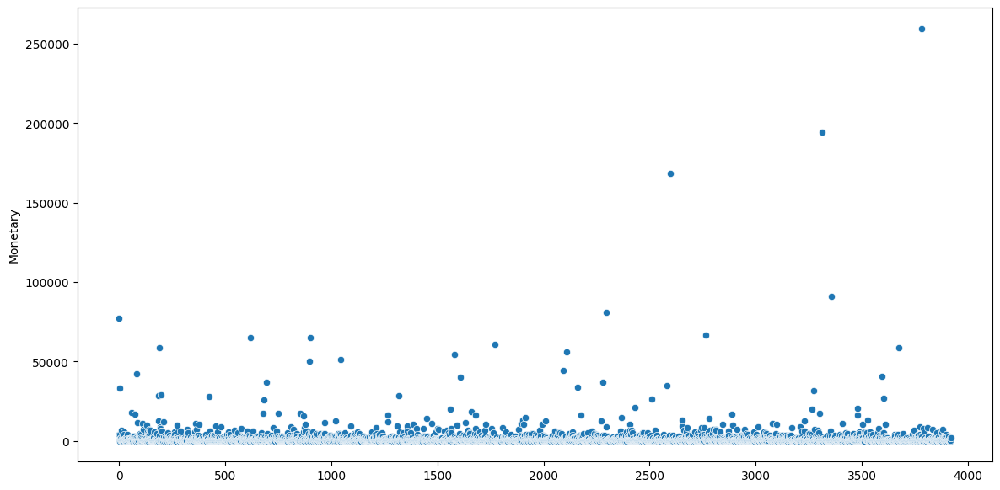

In [ ]:
plt.figure(figsize=(14, 7))
sns.scatterplot(data=customer_monetary.Monetary);

In [ ]:
fig = px.scatter(customer_monetary, x="customerid", y="Monetary")
fig.show(renderer="colab")

In [ ]:
fig = px.histogram(customer_monetary, x="Monetary", nbins=50)
fig.show(renderer="colab")

In [ ]:
dfUK_copy.head(3)

,invoiceno,stockcode,description,quantity,invoicedate,unitprice,customerid,country,total_price,ref_date,date,customer_recency,recency2
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.00,United Kingdom,15.30,2011-12-16,2010-12-01,379 days,379
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.00,United Kingdom,20.34,2011-12-16,2010-12-01,379 days,379
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.00,United Kingdom,22.00,2011-12-16,2010-12-01,379 days,379


In [ ]:
customer_rfm = pd.merge(pd.merge(customer_recency, customer_frequency, on='customerid'), customer_monetary, on='customerid')
customer_rfm.head()

,customerid,Recency,Frequency,Monetary
0,12346.00,332.00,1,77183.60
1,12747.00,9.00,11,4196.01
2,12748.00,7.00,209,33053.19
3,12749.00,10.00,5,4090.88
4,12820.00,10.00,4,942.34


In [ ]:
customer_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3920 entries, 0 to 3919
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   customerid  3920 non-null   float64
 1   Recency     3920 non-null   float64
 2   Frequency   3920 non-null   int64  
 3   Monetary    3920 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 153.1 KB


In [ ]:
customer_rfm.describe()

,customerid,Recency,Frequency,Monetary
count,3920.00,3920.00,3920.00,3920.00
mean,15562.06,98.74,4.25,1858.42
std,1576.59,99.53,7.20,7478.63
min,12346.00,7.00,1.00,3.75
25%,14208.75,24.00,1.00,298.19
50%,15569.50,57.00,2.00,644.97
75%,16913.25,149.00,5.00,1571.28
max,18287.00,380.00,209.00,259657.30


In [ ]:
quantiles = customer_rfm.quantile(q = [0.25, 0.50, 0.75])
quantiles

,customerid,Recency,Frequency,Monetary
0.25,14208.75,24.00,1.00,298.19
0.50,15569.50,57.00,2.00,644.97
0.75,16913.25,149.00,5.00,1571.28


In [ ]:
def recency_scoring(rfm):
    if rfm.Recency <= 24.0:
        recency_score = 4
    elif rfm.Recency <= 57.0:
        recency_score = 3
    elif rfm.Recency <= 149.0:
        recency_score = 2
    else:
        recency_score = 1
    return recency_score

customer_rfm['Recency_Score'] = customer_rfm.apply(recency_scoring, axis=1)
customer_rfm.sample(10)

,customerid,Recency,Frequency,Monetary,Recency_Score
2106,15764.00,95.00,6,3279.97,2
1394,14785.00,17.00,2,77.40,4
3831,18169.00,67.00,1,202.65,2
3305,17433.00,95.00,1,303.16,2
1532,15004.00,154.00,1,1220.77,1
2390,16160.00,72.00,2,1025.44,2
230,13139.00,23.00,7,5064.94,4
3880,18230.00,16.00,7,2810.20,4
3408,17581.00,7.00,25,11025.24,4
2970,16953.00,37.00,1,20.80,3


In [ ]:
fig = px.pie(df, values = customer_rfm['Recency_Score'].value_counts(), 
             names = (customer_rfm["Recency_Score"].value_counts()).index, 
             title = 'Recency Score Distribution')
fig.show(renderer="colab")

In [ ]:
def frequency_scoring(rfm):
    if rfm.Frequency >= 10.0:
        frequency_score = 4
    elif rfm.Frequency >= 5.0:
        frequency_score = 3
    elif rfm.Frequency >= 2.0:
        frequency_score = 2
    else:
        frequency_score = 1
    return frequency_score

customer_rfm['Frequency_Score'] = customer_rfm.apply(frequency_scoring, axis=1)
customer_rfm.sample(10)

,customerid,Recency,Frequency,Monetary,Recency_Score,Frequency_Score
2905,16863.00,38.00,2,502.80,3,2
2982,16968.00,11.00,2,439.43,4,2
54,12888.00,221.00,2,354.12,1,2
1071,14340.00,225.00,1,134.70,1,1
915,14112.00,29.00,7,2915.15,3,3
1941,15544.00,16.00,9,3546.71,4,3
3881,18231.00,199.00,5,2071.77,1,3
3449,17639.00,283.00,1,108.50,1,1
3703,17985.00,29.00,1,631.35,3,1
3655,17923.00,289.00,1,207.50,1,1


In [ ]:
fig = px.pie(df, values = customer_rfm['Frequency_Score'].value_counts(), 
             names = (customer_rfm["Frequency_Score"].value_counts()).index, 
             title = 'Frequency Score Distribution')
fig.show(renderer="colab")

In [ ]:
def monetary_scoring(rfm):
    if rfm.Monetary >= 1571.0:
        monetary_score = 4
    elif rfm.Monetary >= 645.0:
        monetary_score = 3
    elif rfm.Monetary >= 298.0:
        monetary_score = 2
    else:
        monetary_score = 1
    return monetary_score

customer_rfm['Monetary_Score'] = customer_rfm.apply(monetary_scoring, axis=1)
customer_rfm.sample(10)

,customerid,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score
679,13771.00,71.00,4,2634.45,2,2,4
1654,15154.00,82.00,1,254.28,2,1,1
1282,14629.00,11.00,2,955.26,4,2,3
1145,14446.00,7.00,4,1010.35,4,2,3
3206,17299.00,18.00,4,656.61,4,2,3
3839,18178.00,135.00,4,1590.81,2,2,4
224,13133.00,280.00,2,109.80,1,2,1
1022,14262.00,15.00,8,2618.23,4,3,4
3175,17250.00,10.00,2,381.97,4,2,2
3122,17174.00,224.00,1,59.90,1,1,1


In [ ]:
fig = px.pie(df, values = customer_rfm['Monetary_Score'].value_counts(), 
             names = (customer_rfm["Monetary_Score"].value_counts()).index, 
             title = 'Monetary Score Distribution')
fig.show(renderer="colab")

In [ ]:
def rfm_scoring(customer):
    return str(int(customer['Recency_Score'])) + str(int(customer['Frequency_Score'])) + str(int(customer['Monetary_Score']))


customer_rfm['Customer_RFM_Score'] = customer_rfm.apply(rfm_scoring, axis=1)
customer_rfm.sample(8)

,customerid,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score
1518,14974.00,44.00,1,89.94,3,1,1,311
939,14147.00,85.00,2,483.40,2,2,2,222
321,13266.00,18.00,12,3834.26,4,4,4,444
1486,14916.00,77.00,4,1268.98,2,2,3,223
1021,14261.00,57.00,2,1163.45,3,2,3,323
3220,17323.00,22.00,7,906.52,4,3,3,433
1267,14606.00,8.00,93,12076.15,4,4,4,444
178,13068.00,17.00,2,344.00,4,2,2,422


In [ ]:
fig = px.histogram(customer_rfm, x = customer_rfm['Customer_RFM_Score'].value_counts().index, 
                   y = customer_rfm['Customer_RFM_Score'].value_counts().values, 
                   title = 'Customer RFM Score Distribution',
                   labels = dict(x = "Customer_RFM_Score", y ="counts"))
fig.show(renderer="colab")

In [ ]:
customer_rfm['RFM_Label'] = customer_rfm['Recency_Score'] + customer_rfm['Frequency_Score'] + customer_rfm['Monetary_Score']

customer_rfm.sample(8)

,customerid,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_Label
1445,14860.00,26.00,1,170.32,3,1,1,311,5
1927,15526.00,40.00,2,148.44,3,2,1,321,6
637,13717.00,39.00,6,1445.01,3,3,3,333,9
2297,16033.00,12.00,20,8778.82,4,4,4,444,12
1670,15179.00,25.00,5,2206.95,3,3,4,334,10
2722,16621.00,58.00,4,813.48,2,2,3,223,7
594,13654.00,50.00,6,2707.33,3,3,4,334,10
1638,15134.00,21.00,8,1387.99,4,3,3,433,10


In [ ]:
fig = px.pie(df, values = customer_rfm['RFM_Label'].value_counts(), 
             names = (customer_rfm["RFM_Label"].value_counts()).index, 
             title = 'RFM Label Distribution')
fig.show(renderer="colab")

In [ ]:
customer_rfm['RFM_Label'].min()

3

In [ ]:
customer_rfm['RFM_Label'].max()

12

In [ ]:
np.sort(customer_rfm['RFM_Label'].unique())

array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [ ]:
segments = {'Customer_Segment':['Champion', 
                                'Top Loyal Customer', 
                                'Loyal Customer', 
                                'Top Recent Customer', 
                                'Recent Customer', 
                                'Top Customer Needed Attention', 
                                'Customer Needed Attention', 
                                'Top Lost Customer', 
                                'Lost Customer'],
            'RFM':['(2|3|4)-(4)-(4)', 
                   '(3)-(1|2|3|4)-(3|4)', 
                   '(3)-(1|2|3|4)-(1|2)', 
                   '(4)-(1|2|3|4)-(3|4)', 
                   '(4)-(1|2|3|4)-(1|2)',
                   '(2|3)-(1|2|3|4)-(3|4)', 
                   '(2|3)-(1|2|3|4)-(1|2)',
                   '(1)-(1|2|3|4)-(3|4)', 
                   '(1)-(1|2|3|4)-(1|2)',]}

pd.DataFrame(segments)

,Customer_Segment,RFM
0,Champion,(2|3|4)-(4)-(4)
1,Top Loyal Customer,(3)-(1|2|3|4)-(3|4)
2,Loyal Customer,(3)-(1|2|3|4)-(1|2)
3,Top Recent Customer,(4)-(1|2|3|4)-(3|4)
4,Recent Customer,(4)-(1|2|3|4)-(1|2)
5,Top Customer Needed Attention,(2|3)-(1|2|3|4)-(3|4)
6,Customer Needed Attention,(2|3)-(1|2|3|4)-(1|2)
7,Top Lost Customer,(1)-(1|2|3|4)-(3|4)
8,Lost Customer,(1)-(1|2|3|4)-(1|2)


In [ ]:
def categorizer(rfm):
    
    if (rfm[0] in ['2', '3', '4']) & (rfm[1] in ['4']) & (rfm[2] in ['4']):
        rfm = 'Champion'
        
    elif (rfm[0] in ['3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Loyal Customer'
        
    elif (rfm[0] in ['3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Loyal Customer'
    
    elif (rfm[0] in ['4']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Recent Customer'
    
    elif (rfm[0] in ['4']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Recent Customer'
    
    elif (rfm[0] in ['2', '3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Customer Needed Attention'    
   
    elif (rfm[0] in ['2', '3']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Customer Needed Attention'
    
    elif (rfm[0] in ['1']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['3', '4']):
        rfm = 'Top Lost Customer'
                
    elif (rfm[0] in ['1']) & (rfm[1] in ['1', '2', '3', '4']) & (rfm[2] in ['1', '2']):
        rfm = 'Lost Customer'
    
    return rfm 

In [ ]:
customer_rfm['Customer_Category'] = customer_rfm["Customer_RFM_Score"].apply(categorizer)
customer_rfm

,customerid,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_Label,Customer_Category
0,12346.00,332.00,1,77183.60,1,1,4,114,6,Top Lost Customer
1,12747.00,9.00,11,4196.01,4,4,4,444,12,Champion
2,12748.00,7.00,209,33053.19,4,4,4,444,12,Champion
3,12749.00,10.00,5,4090.88,4,3,4,434,11,Top Recent Customer
4,12820.00,10.00,4,942.34,4,2,3,423,9,Top Recent Customer
...,...,...,...,...,...,...,...,...,...,...
3915,18280.00,284.00,1,180.60,1,1,1,111,3,Lost Customer
3916,18281.00,187.00,1,80.82,1,1,1,111,3,Lost Customer
3917,18282.00,14.00,2,178.05,4,2,1,421,7,Recent Customer
3918,18283.00,10.00,16,2045.53,4,4,4,444,12,Champion


In [ ]:
fig = px.histogram(customer_rfm, 
                   x = customer_rfm['Customer_Category'].value_counts().index, 
                   y = customer_rfm['Customer_Category'].value_counts().values,
                   title = 'Customer Category Distribution',
                   labels = dict(x = "Customer_Category", y ="counts"))
fig.show(renderer="colab")

In [ ]:
fig = px.pie(df, 
             values = customer_rfm['Customer_Category'].value_counts(), 
             names = (customer_rfm["Customer_Category"].value_counts()).index, 
             title = 'Customer Category Distribution')
fig.show(renderer="colab")

In [ ]:
Avg_RFM_Label = customer_rfm.groupby('Customer_Category').RFM_Label.mean()
Size_RFM_Label = customer_rfm['Customer_Category'].value_counts()
df_customer_segmentation = pd.concat([Avg_RFM_Label, Size_RFM_Label], axis=1).rename(columns={'RFM_Label':'Avg_RFM_Label',
                                                                           'Customer_Category':'Size_RFM_Label'})
df_customer_segmentation

,Avg_RFM_Label,Size_RFM_Label
Champion,11.72,347
Customer Needed Attention,4.92,512
Lost Customer,3.68,806
Loyal Customer,6.01,408
Recent Customer,7.26,234
Top Customer Needed Attention,7.53,445
Top Lost Customer,6.17,173
Top Loyal Customer,8.75,487
Top Recent Customer,10.06,508


In [ ]:
fig = px.histogram(customer_rfm, 
                   x = customer_rfm.groupby('Customer_Category').RFM_Label.mean().sort_values(ascending=False).index, 
                   y = customer_rfm.groupby('Customer_Category').RFM_Label.mean().sort_values(ascending=False).values, 
                   title = 'The Average of RFM Label',
                   labels = dict(x = "Customer Segments (Categories)", y ="RFM Label Mean Values"))
fig.show(renderer="colab")

In [ ]:
fig = px.treemap(df_customer_segmentation, 
                 path=[df_customer_segmentation.index], 
                 values='Avg_RFM_Label', 
                 width=950, height=600)

fig.update_layout(title_text='The Average of Each Customer Segments',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show(renderer="colab")

In [ ]:
fig = px.histogram(customer_rfm, 
                   x = customer_rfm['Customer_Category'].value_counts().index, 
                   y = customer_rfm['Customer_Category'].value_counts().values, 
                   title = 'The Size of RFM Label',
                   labels = dict(x = "Customer Segments (Categories)", y ="RFM Label Mean Values"))
fig.show(renderer="colab")

In [ ]:
fig = px.treemap(df_customer_segmentation, 
                 path=[df_customer_segmentation.index], 
                 values='Size_RFM_Label', 
                 width=950, height=600)

fig.update_layout(title_text='Customer Segmentation',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show(renderer="colab")

In [ ]:
segmentation = pd.DataFrame(customer_rfm.Customer_Category.value_counts(dropna=False).sort_values(ascending=False))
segmentation.reset_index(inplace=True)
segmentation.rename(columns={'index':'Customer Category', 'Customer_Category':'The Number Of Customer'}, inplace=True)
segmentation

,Customer Category,The Number Of Customer
0,Lost Customer,806
1,Customer Needed Attention,512
2,Top Recent Customer,508
3,Top Loyal Customer,487
4,Top Customer Needed Attention,445
5,Loyal Customer,408
6,Champion,347
7,Recent Customer,234
8,Top Lost Customer,173


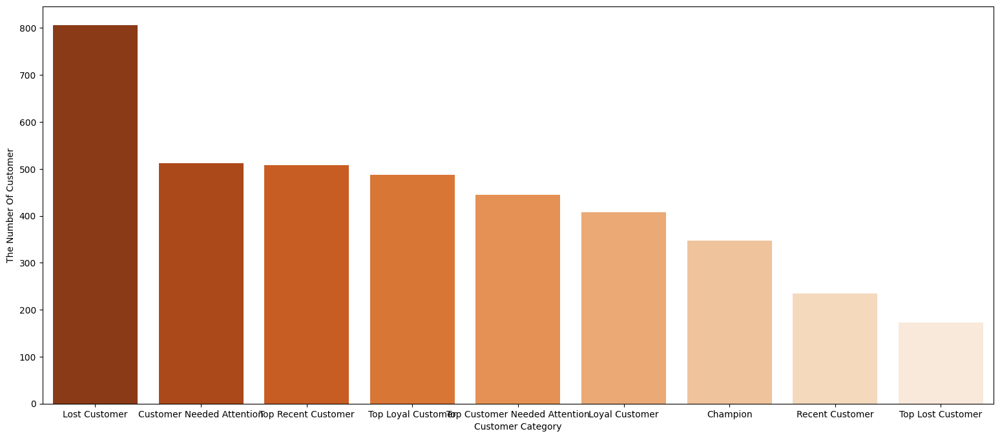

In [ ]:
plt.figure(figsize=(19, 8))

sns.barplot(data=segmentation, x='Customer Category', y='The Number Of Customer', palette='Oranges_r');

In [ ]:
fig = px.bar(segmentation, x='Customer Category', y='The Number Of Customer')
fig.show(renderer="colab")

In [ ]:
segmentation

,Customer Category,The Number Of Customer
0,Lost Customer,806
1,Customer Needed Attention,512
2,Top Recent Customer,508
3,Top Loyal Customer,487
4,Top Customer Needed Attention,445
5,Loyal Customer,408
6,Champion,347
7,Recent Customer,234
8,Top Lost Customer,173


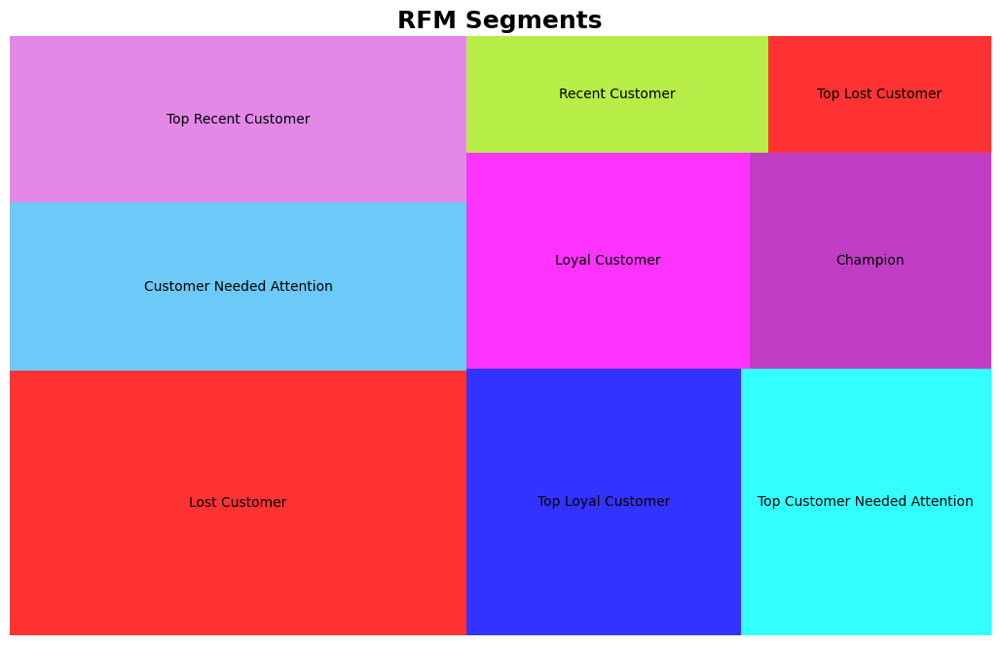

In [ ]:

fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(13, 8)
sq.plot(sizes=segmentation['The Number Of Customer'], 
                      label=['Lost Customer', 
                            'Customer Needed Attention', 
                            'Top Recent Customer', 
                            'Top Loyal Customer', 
                            'Top Customer Needed Attention', 
                            'Loyal Customer', 
                            'Champion', 
                            'Recent Customer', 
                            'Top Lost Customer'], 
                            alpha=0.8, 
                            color=["red", "#48BCF5", "#DD6AE1", "blue", "cyan", "magenta", '#B20CB7', "#A4E919"])
plt.title("RFM Segments", fontsize=18, fontweight="bold")
plt.axis('off')
plt.show()

In [ ]:

fig = px.treemap(segmentation,
                 path=[segmentation['Customer Category']], 
                 values='The Number Of Customer', 
                 width=900, 
                 height=600)
fig.update_layout(title="RFM Segments",
                  title_x = 0.5, title_font = dict(size=18),
                 )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show(renderer="colab")

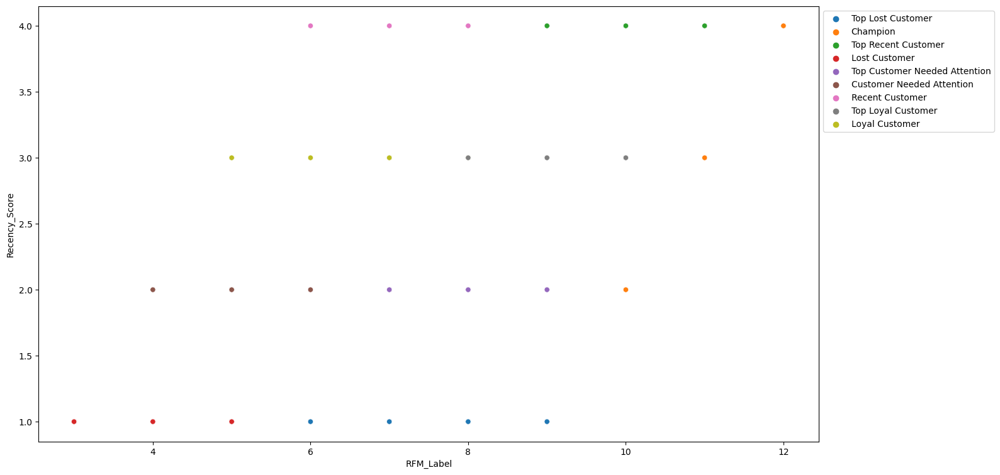

In [ ]:
g = sns.scatterplot(data=customer_rfm, x="RFM_Label", y="Recency_Score", hue="Customer_Category")
g.legend(loc='center left', bbox_to_anchor=(1, 0.85), ncol=1);

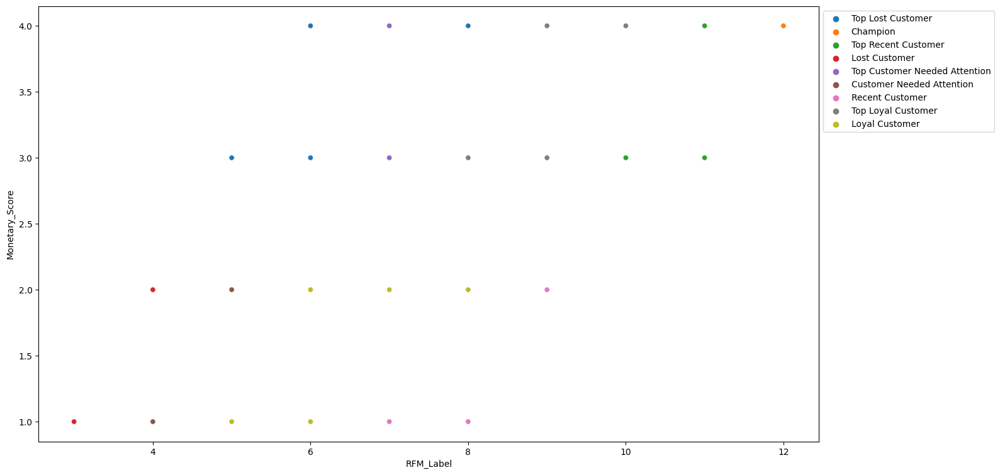

In [ ]:
g = sns.scatterplot(data=customer_rfm, x="RFM_Label", y="Monetary_Score", hue="Customer_Category")
g.legend(loc='center left', bbox_to_anchor=(1, 0.85), ncol=1);

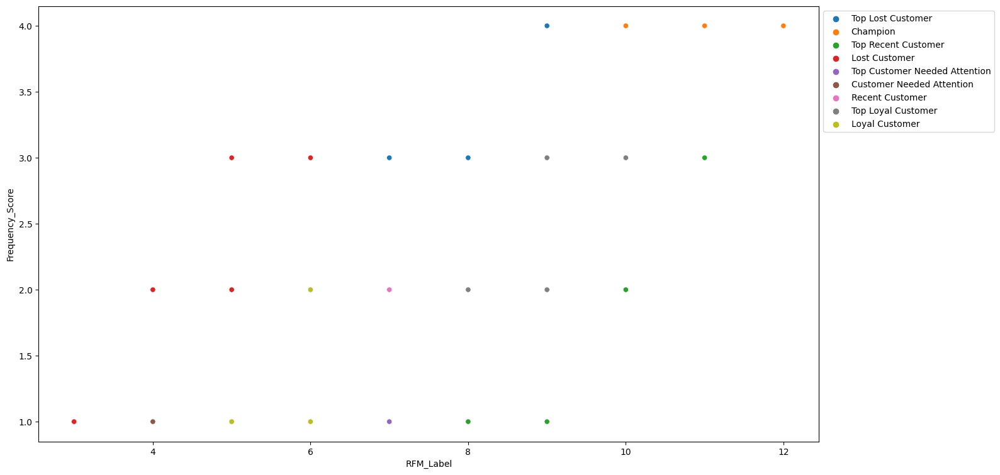

In [ ]:
g = sns.scatterplot(data=customer_rfm, x="RFM_Label", y="Frequency_Score", hue="Customer_Category")
g.legend(loc='center left', bbox_to_anchor=(1, 0.85), ncol=1);

<Figure size 2000x2000 with 0 Axes>

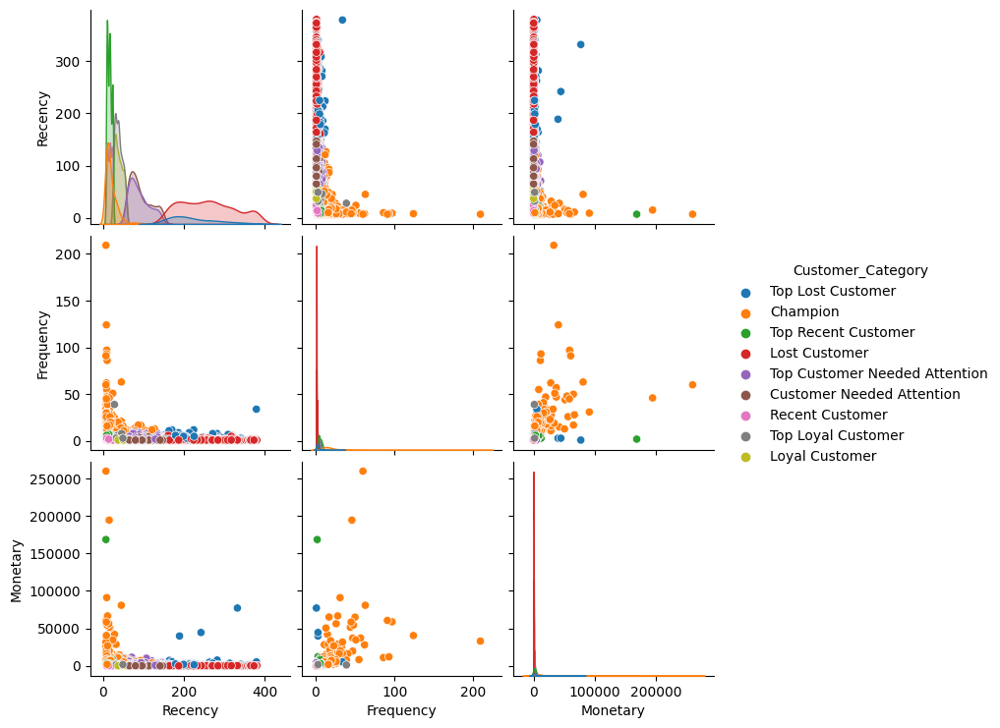

In [ ]:
plt.figure(figsize=(20, 20))
sns.pairplot(customer_rfm[['Recency', 'Frequency', 'Monetary','Customer_Category']], hue='Customer_Category');

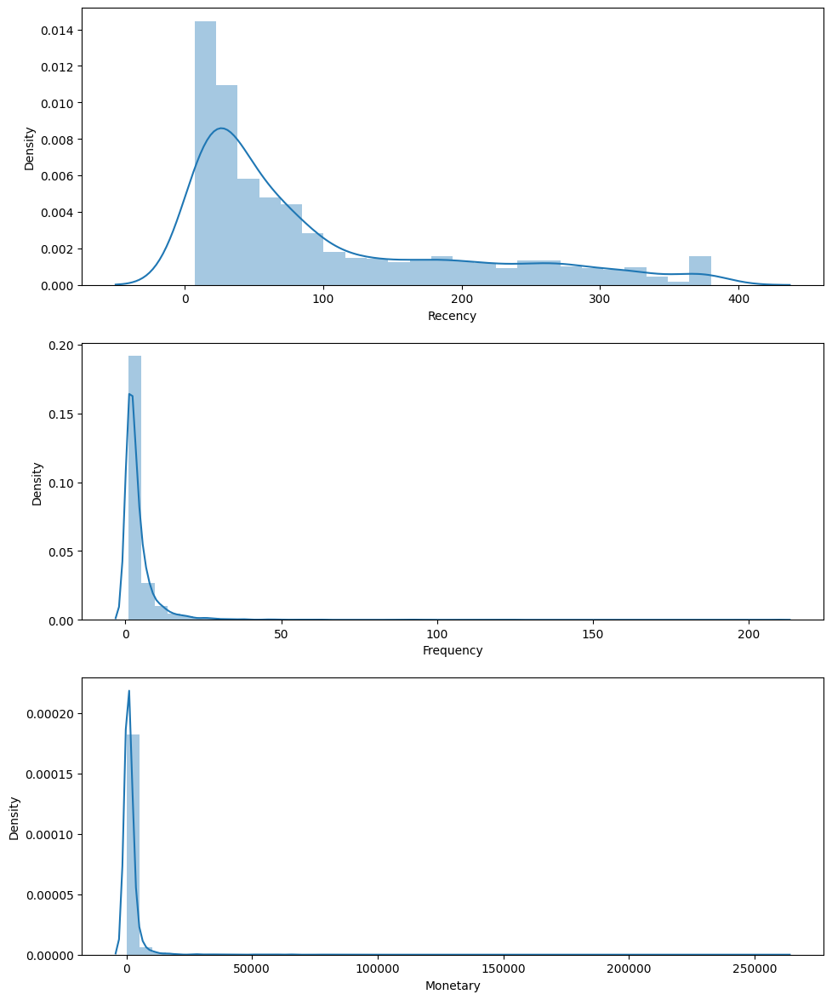

In [ ]:

f, ax = plt.subplots(figsize=(10, 12))
plt.subplot(3, 1, 1); sns.distplot(customer_rfm.Recency, label = 'Recency')
plt.subplot(3, 1, 2); sns.distplot(customer_rfm.Frequency, label = 'Frequency')
plt.subplot(3, 1, 3); sns.distplot(customer_rfm.Monetary, label = 'Monetary')
plt.style.use('fivethirtyeight')
plt.tight_layout()
plt.show()

In [ ]:
customer_rfm.set_index("customerid", inplace=True)

In [ ]:

skew_limit = 0.75  
skew_vals = customer_rfm[['Recency', 'Frequency', 'Monetary']].skew()
skew_cols = skew_vals[abs(skew_vals)> skew_limit].sort_values(ascending=False)
skew_cols

Monetary    20.22
Frequency   10.75
Recency      1.24
dtype: float64

Monetary     0.37
Frequency   10.75
Recency      1.24
dtype: float64
Monetary    0.37
Frequency   1.18
Recency     1.24
dtype: float64
Monetary    0.37
Frequency   1.18
Recency     0.01
dtype: float64



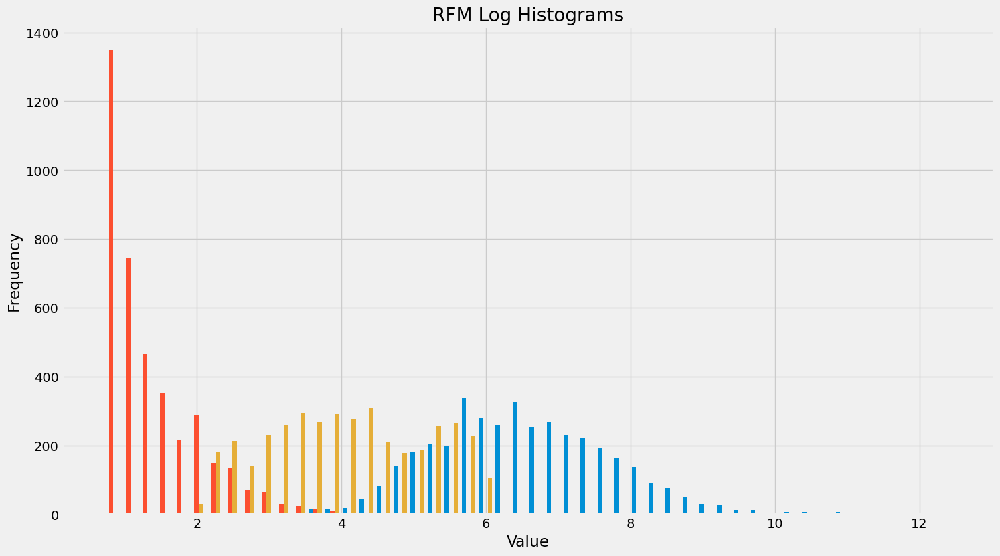

In [ ]:
rfm_log = customer_rfm[skew_cols.index].copy()

for col in skew_cols.index.values:
    rfm_log[col] = rfm_log[col].apply(np.log1p)

    print(rfm_log.skew())
print()

plt.hist(rfm_log, bins=50)
plt.title('RFM Log Histograms')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

In [ ]:


rfm_before_trans = customer_rfm[skew_cols.index].copy()
pt = PowerTransformer(method='yeo-johnson')
trans= pt.fit_transform(rfm_before_trans)
rfm_trans = pd.DataFrame(trans, columns =skew_cols.index )

print(rfm_trans.skew())
print()

Monetary    -0.01
Frequency    0.22
Recency      0.00
dtype: float64



In [ ]:


for skew in rfm_trans.skew():
    if -0.75 < skew < 0.75:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.75 < skew < -1.0 or 0.75 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')


A skewness value of   -0.013748915711226934  means that the distribution is approx.   symmetric 
A skewness value of   0.21568143175262353  means that the distribution is approx.   symmetric 
A skewness value of   0.0026472953555950027  means that the distribution is approx.   symmetric 


**2. Plot normalized data with scatter matrix or pairplot. Also evaluate results.**

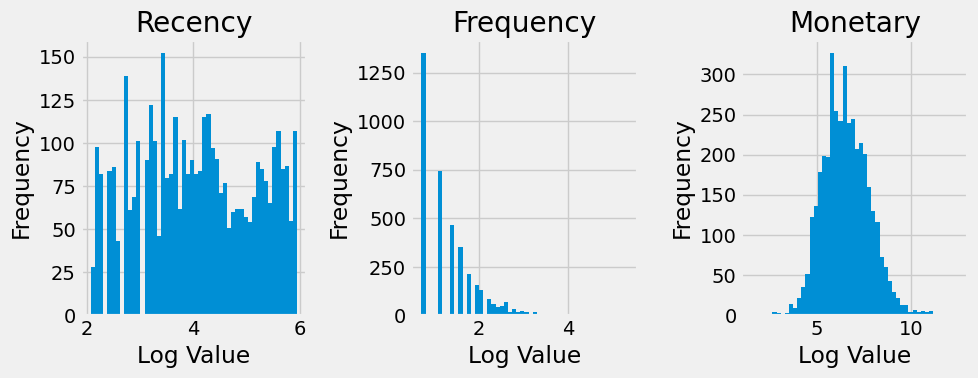

In [ ]:

import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(10, 4))

axs[0].hist(rfm_log['Recency'], bins=50)
axs[1].hist(rfm_log['Frequency'], bins=50)
axs[2].hist(rfm_log['Monetary'], bins=50)

axs[0].set_title('Recency')
axs[0].set_xlabel('Log Value')
axs[0].set_ylabel('Frequency')

axs[1].set_title('Frequency')
axs[1].set_xlabel('Log Value')
axs[1].set_ylabel('Frequency')

axs[2].set_title('Monetary')
axs[2].set_xlabel('Log Value')
axs[2].set_ylabel('Frequency')

plt.tight_layout()

plt.show()


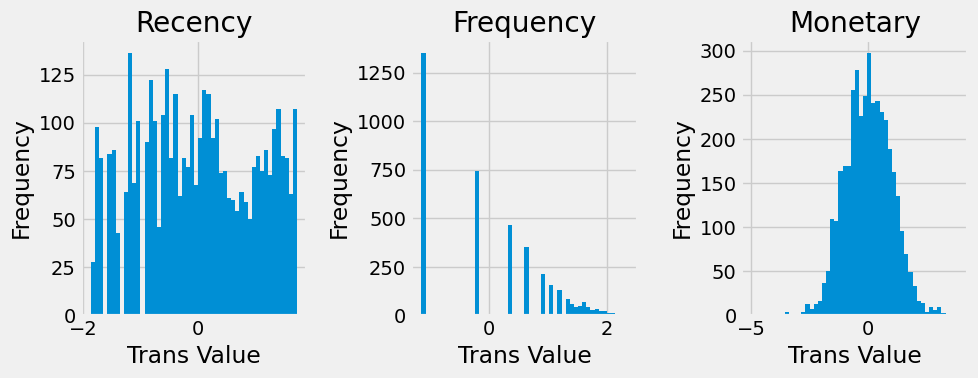

In [ ]:


import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(10, 4))

axs[0].hist(rfm_trans['Recency'], bins=50)
axs[1].hist(rfm_trans['Frequency'], bins=50)
axs[2].hist(rfm_trans['Monetary'], bins=50)

axs[0].set_title('Recency')
axs[0].set_xlabel('Trans Value')
axs[0].set_ylabel('Frequency')

axs[1].set_title('Frequency')
axs[1].set_xlabel('Trans Value')
axs[1].set_ylabel('Frequency')

axs[2].set_title('Monetary')
axs[2].set_xlabel('Trans Value')
axs[2].set_ylabel('Frequency')

plt.tight_layout()

plt.show()


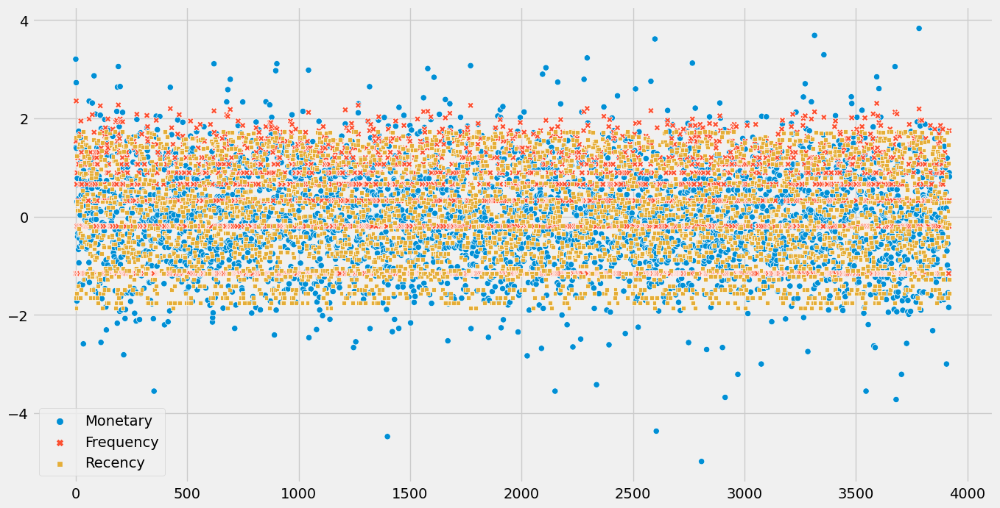

In [ ]:
plt.figure(figsize = (15, 8))
sns.scatterplot(data = rfm_trans);

In [ ]:
fig = px.scatter_3d(rfm_trans, 
                    x='Recency',
                    y='Frequency',
                    z='Monetary',
                    color='Frequency')
fig.show(renderer="colab");

In [ ]:
!pip install pyclustertend

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 74.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.4/15.4 MB 81.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.3/26.3 MB 58.7 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
  Attempting uninstall: llvmlite
    Found existing installation: llvmlite 0.39.1
    Uninstalling llvmlite-0.39.1:
      Successfully uninstalled llvmlite-0.39.1
  Attempting uninstall: numba
    Found existing installation: numba 0.56.4
    Uninstalling numba-0.56.4:
      Successfully uninstalled numba-0.56.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.0 re

In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from pyclustertend import hopkins
from sklearn.preprocessing import scale
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_samples,silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
from yellowbrick.cluster import KElbowVisualizer

In [ ]:

scaler = StandardScaler()
scaler.fit(rfm_trans)

rfm_scaled = scaler.transform(rfm_trans)

In [ ]:

hopkins(rfm_scaled, rfm_scaled.shape[0])

0.087504432899951

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7f68cc9f8f70>
Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 584, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 725, in _make_controller_from_path
    lib_controller = lib_controller_class(
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 842, in __init__
    super().__init__(**kwargs)
  File "/usr/local/lib/python3.9/dist-packages/threadpoolctl.py", line 810, in __init__
    self._dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.9/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /usr/local/lib/python3.9/dist-packages/numpy.libs/libopenblas64_p-r0-2f7c42d4.3.18.so: cannot open shar

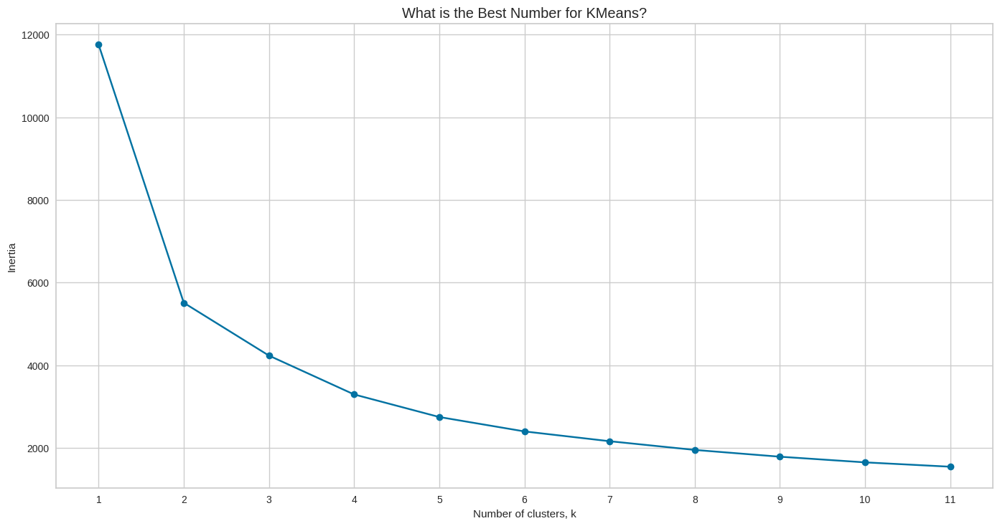

In [ ]:
ks = range(1, 12)
inertias=[]
for k in ks :
    kc = KMeans(n_clusters=k, random_state=42)
    kc.fit(rfm_scaled)
    inertias.append(kc.inertia_)

f, ax = plt.subplots(figsize=(15, 8))
plt.plot(ks, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('What is the Best Number for KMeans?')
plt.show()

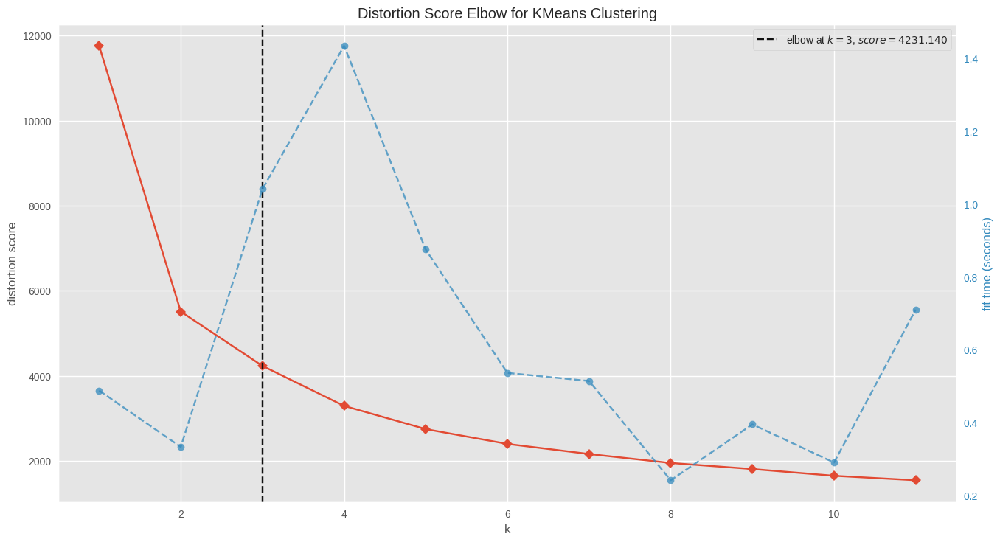

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:

plt.rcParams['figure.facecolor'] = 'white'
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 12))

plt.figure(figsize=(14, 8))
visualizer.fit(rfm_scaled)        
visualizer.show() 

In [ ]:
ssd =[]

K = range(2, 12)

for k in K:
    model = KMeans(n_clusters=k)
    model.fit(rfm_scaled)
    ssd.append(model.inertia_)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(rfm_scaled, model.labels_)}')

Silhouette Score for 2 clusters: 0.43720271135718575
Silhouette Score for 3 clusters: 0.331430364855983
Silhouette Score for 4 clusters: 0.34521539676622004
Silhouette Score for 5 clusters: 0.3340928129854785
Silhouette Score for 6 clusters: 0.3306569822683435
Silhouette Score for 7 clusters: 0.3101309424358163
Silhouette Score for 8 clusters: 0.3014424445707716
Silhouette Score for 9 clusters: 0.3029035706798401
Silhouette Score for 10 clusters: 0.30569214163371494
Silhouette Score for 11 clusters: 0.301439507328638


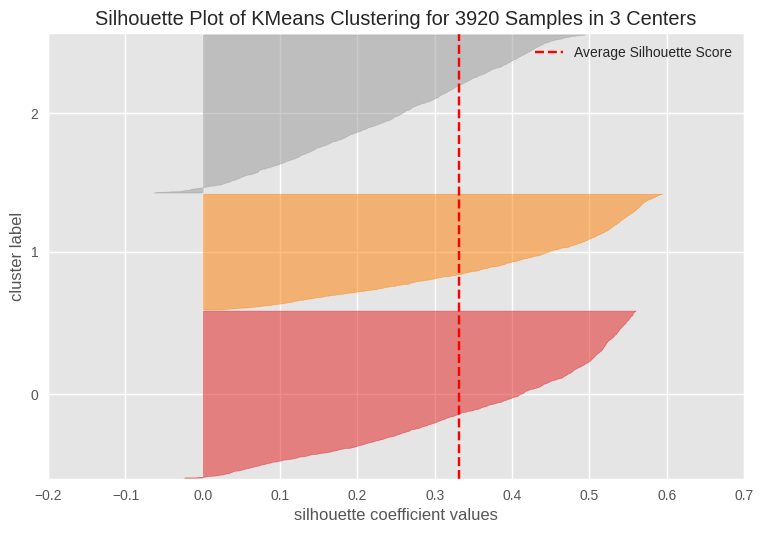

In [ ]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model_3 = KMeans(n_clusters=3, random_state=42)
visualizer = SilhouetteVisualizer(model_3)

visualizer.fit(rfm_scaled)   
visualizer.poof();

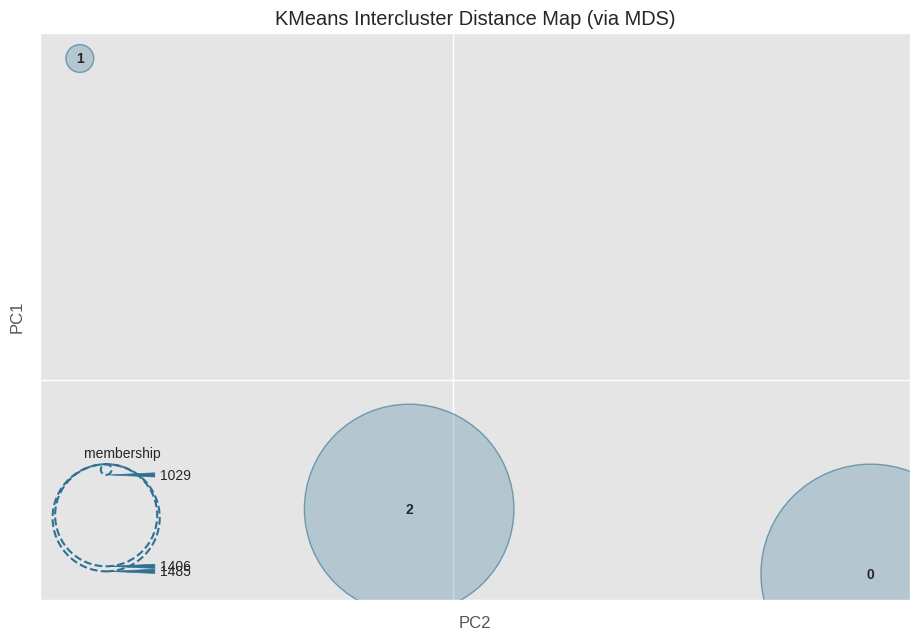

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [ ]:
from yellowbrick.cluster import InterclusterDistance
plt.rcParams["figure.figsize"] = (10, 7)

model = KMeans(3)
visualizer = InterclusterDistance(model_3)

visualizer.fit(rfm_scaled)  
visualizer.show()  

In [ ]:

kmeans = KMeans(n_clusters = 3).fit(rfm_scaled)
kmeans.fit_predict(rfm_scaled)
labels = kmeans.labels_
rfm_trans['ClusterID']=labels
rfm_trans

,Monetary,Frequency,Recency,ClusterID
0,3.20,-1.16,1.61,2
1,1.41,1.53,-1.66,1
2,2.73,2.35,-1.87,1
3,1.39,0.89,-1.57,1
4,0.30,0.66,-1.57,1
...,...,...,...,...
3915,-1.10,-1.16,1.46,0
3916,-1.85,-1.16,1.08,0
3917,-1.11,-0.20,-1.27,2
3918,0.89,1.75,-1.57,1


In [ ]:
rfm_trans.ClusterID.value_counts()

0    1485
2    1407
1    1028
Name: ClusterID, dtype: int64

In [ ]:
fig = px.pie(df, values = rfm_trans['ClusterID'].value_counts(), 
             names = (rfm_trans['ClusterID'].value_counts()).index, 
             title = 'Predicted Clusters Distribution')
fig.show(renderer="colab")

In [ ]:
customer_rfm['ClusterID'] = labels
customer_rfm.sample(20)

,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_Label,Customer_Category,ClusterID
customerid,,,,,,,,,,
13948.00,367.00,1,102.00,1,1,1,111,3,Lost Customer,0
18016.00,39.00,5,1477.66,3,3,3,333,9,Top Loyal Customer,1
12917.00,135.00,1,594.00,2,1,2,212,5,Customer Needed Attention,0
15043.00,38.00,1,537.00,3,1,2,312,6,Loyal Customer,0
15494.00,28.00,2,1280.58,3,2,3,323,8,Top Loyal Customer,2
13990.00,220.00,1,311.30,1,1,2,112,4,Lost Customer,0
13117.00,28.00,8,984.91,3,3,3,333,9,Top Loyal Customer,1
13850.00,136.00,1,1595.48,2,1,4,214,7,Top Customer Needed Attention,0
16419.00,119.00,6,958.71,2,3,3,233,8,Top Customer Needed Attention,2


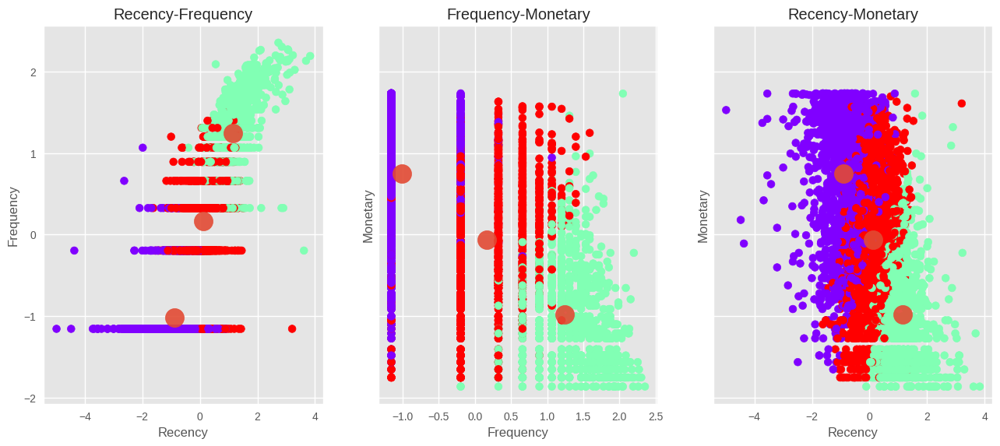

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(14, 6)) 
ax1.set_title('Recency-Frequency')
ax1.set_xlabel('Recency')
ax1.set_ylabel('Frequency')
ax1.scatter(rfm_trans.iloc[:, 0], rfm_trans.iloc[:, 1], c=kmeans.labels_, cmap="rainbow")
ax1.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, alpha=0.9, label = 'Centroids')

ax2.set_title("Frequency-Monetary")
ax2.set_xlabel('Frequency')
ax2.set_ylabel('Monetary')
ax2.scatter(rfm_trans.iloc[:, 1], rfm_trans.iloc[:, 2], c=kmeans.labels_,cmap="rainbow")
ax2.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 2], s=300, alpha=0.9, label = 'Centroids')

ax3.set_title("Recency-Monetary")
ax3.set_xlabel('Recency')
ax3.set_ylabel('Monetary')
ax3.scatter(rfm_trans.iloc[:, 0], rfm_trans.iloc[:, 2], c=kmeans.labels_,cmap="rainbow")
ax3.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 2], s=300, alpha=0.9, label = 'Centroids');

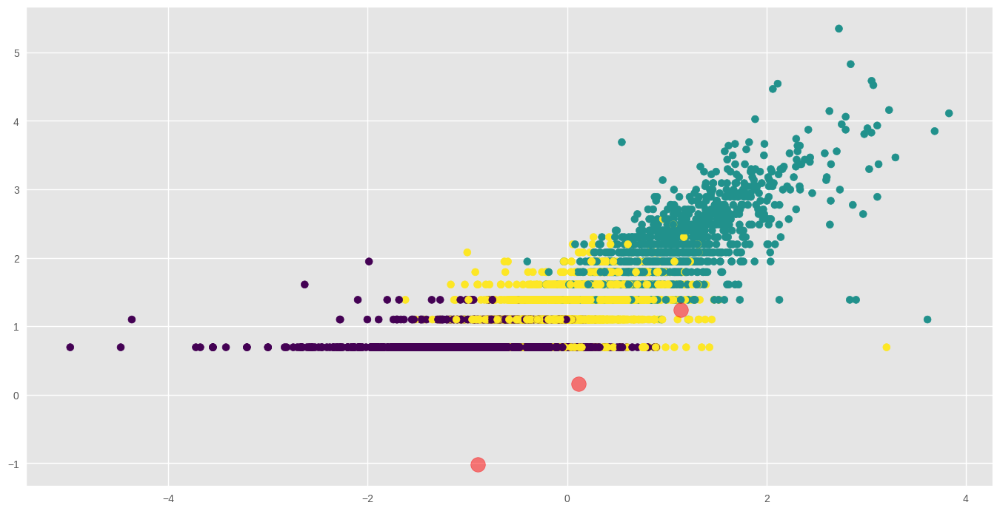

In [ ]:
plt.figure(figsize=(15, 8))
plt.scatter(rfm_trans.iloc[:, 0], rfm_log.iloc[:, 1], c = labels, s = 50, cmap = "viridis")
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='red',alpha=0.5, label = 'Centroids');

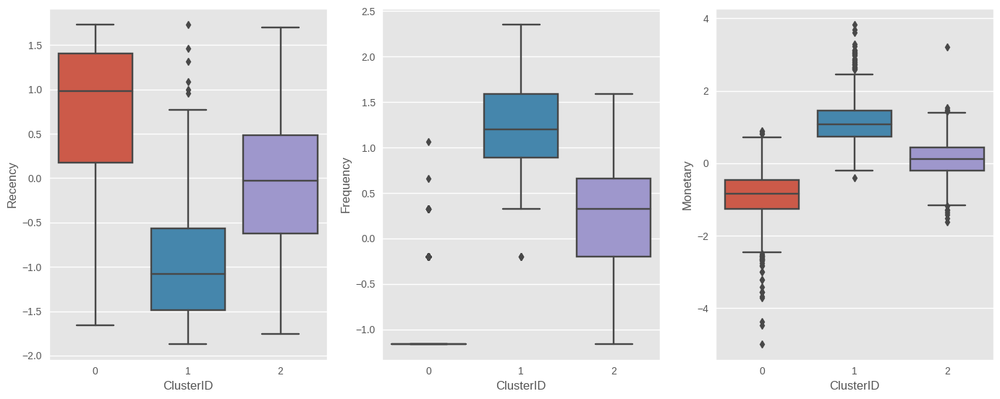

In [ ]:
plt.figure(figsize=(15,6))

plt.subplot(1, 3, 1)
sns.boxplot(x=rfm_trans['ClusterID'],y= rfm_trans['Recency'])

plt.subplot(1, 3, 2)
sns.boxplot(x=rfm_trans['ClusterID'],y= rfm_trans['Frequency'])

plt.subplot(1, 3, 3)
sns.boxplot(x=rfm_trans['ClusterID'],y= rfm_trans['Monetary'])
plt.show()

In [ ]:
rfm_trans['Labels'] = rfm_trans['ClusterID'].map({0:'Lost/Needed Attention Customers', 1:'Current Custemer', 2:'Top/Best Customer'})
rfm_trans.sample(8) 

,Monetary,Frequency,Recency,ClusterID,Labels
148,1.75,1.07,0.67,1,Current Custemer
2773,-0.25,-0.20,0.24,2,Top/Best Customer
732,0.52,0.89,-1.76,1,Current Custemer
409,1.40,1.20,-0.40,1,Current Custemer
1675,-0.62,-1.16,0.27,0,Lost/Needed Attention Customers
550,-0.45,-0.20,-0.92,2,Top/Best Customer
1548,-0.49,-1.16,-0.33,0,Lost/Needed Attention Customers
2246,-0.41,-0.20,-0.59,2,Top/Best Customer


In [ ]:
extracted_col = rfm_trans['Labels']

customer_rfm['K-Means Predicted Cluster'] = rfm_trans['Labels'].values
customer_rfm.sample(8)

,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_Label,Customer_Category,ClusterID,K-Means Predicted Cluster
customerid,,,,,,,,,,,
15148.00,17.00,1,301.29,4,1,2,412,7,Recent Customer,2,Top/Best Customer
12852.00,301.00,1,311.55,1,1,2,112,4,Lost Customer,0,Lost/Needed Attention Customers
15904.00,15.00,1,164.68,4,1,1,411,6,Recent Customer,0,Lost/Needed Attention Customers
15142.00,53.00,1,498.74,3,1,2,312,6,Loyal Customer,0,Lost/Needed Attention Customers
16826.00,58.00,1,341.70,2,1,2,212,5,Customer Needed Attention,0,Lost/Needed Attention Customers
16096.00,271.00,1,320.62,1,1,2,112,4,Lost Customer,0,Lost/Needed Attention Customers
13439.00,262.00,1,283.71,1,1,1,111,3,Lost Customer,0,Lost/Needed Attention Customers
17288.00,16.00,7,1417.63,4,3,3,433,10,Top Recent Customer,1,Current Custemer


In [ ]:
RFM_Customer_Segment = pd.DataFrame(customer_rfm['Customer_Category'].value_counts(dropna=False).sort_values(ascending=False))
RFM_Customer_Segment.reset_index(inplace=True)
RFM_Customer_Segment.rename(columns={'index':'RFM Customer Segment', 'Customer_Category':'The Number Of Customer'}, inplace=True)
RFM_Customer_Segment

,RFM Customer Segment,The Number Of Customer
0,Lost Customer,806
1,Customer Needed Attention,512
2,Top Recent Customer,508
3,Top Loyal Customer,487
4,Top Customer Needed Attention,445
5,Loyal Customer,408
6,Champion,347
7,Recent Customer,234
8,Top Lost Customer,173


In [ ]:
KMeans_Predicted_Clusters = pd.DataFrame(customer_rfm['K-Means Predicted Cluster'].value_counts(dropna=False).sort_values(ascending=False))
KMeans_Predicted_Clusters.reset_index(inplace=True)
KMeans_Predicted_Clusters.rename(columns={'index':'K-Means Predicted Cluster', 'K-Means Predicted Cluster':'The Number Of Customer'}, inplace=True)
KMeans_Predicted_Clusters

,K-Means Predicted Cluster,The Number Of Customer
0,Lost/Needed Attention Customers,1485
1,Top/Best Customer,1407
2,Current Custemer,1028


In [ ]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=customer_rfm['K-Means Predicted Cluster'].values,
    y=customer_rfm['K-Means Predicted Cluster'].index,
    name='Predicted-Clusters By K-Means',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    x=customer_rfm['Customer_Category'].values,
    y=customer_rfm['Customer_Category'].index,
    name='Customer-Segment By RFM Analysis',
    marker_color='lightsalmon'
))

fig.update_layout(barmode='relative', 
                  xaxis_tickangle=-45, 
                  title="The Comparison of Predicted-Clusters By K-Means vs Customer-Segment By RFM Analysis")
fig.update_traces(dict(marker_line_width=0))
fig.show(renderer="colab")